<h1>Classificador de Frutas</h1>


<h3>Exibir meta dados do trabalho</h3>
<ul>
    <li>Aqui iremos exibir dados como: autores, camera utilizada, resolução da imagem, etc.</li>
</ul>

In [1]:
from utils.show_metadata import show_json_metadata
json_file = 'metadata.json'
show_json_metadata(json_file)

╔═══════════════════════════════════════════════════════╗
║ 📊 METADADOS DO PROJETO (metadata.json)               ║
╚═══════════════════════════════════════════════════════╝

🔹 Autores:
    - Eduardo Bif Pitol
    - Eduardo Bombonatto Lorenzetti
    - Gabriela Strieder Ramos
    - Jose Vitor Montanger Ribeiro da Silva

🔹 Descricao:
    Base de dados de imagens de 10 frutas aleatorias.

🔹 Resolucao Imagens Original:
    - Largura: 3024
    - Altura: 4032

🔹 Resolucao Imagens Resize:
    - Largura: 336
    - Altura: 448

🔹 Num Classes:
    10

🔹 Classes:
    ID | Nome da Classe
    ---|---------------
    0  | acerola
    1  | lemon
    2  | cherry_tomato
    3  | khaki
    4  | banana
    5  | lime
    6  | orange_lemon
    7  | avocado
    8  | tangerine
    9  | pear

🔹 Camera Model:
    iPhone 12 e iPhone 13

🔹 Feature Used:
    Modo Retrato (Portrait Mode)

🔹 Lighting Condition:
    Luz Natural (Natural Light)

─────────────────────────────────────────────────────────


In [4]:
from PIL import Image
from pillow_heif import register_heif_opener
import os
import skimage as ski
from matplotlib import pyplot as pl

<h2>1. Criação do Dataset</h2>
<ul>
    <li>Depois de ter escolhido qual seriam os objetos, tiramos 20 fotos de cada classe, 5 itens de cada classa, 4 fotos de cada item, sendo dessas 4 fotos 2 com background branco e 2 com background preto, em duas posições diferentes;</li>
    <li>Vamos pegar as fotos tiradas com aparelho apple, e converte-las para <i style="color: green;">PNG</i>, pois nestes aparelhos é capturado com o formato <i style="color: green;">HEIC.</i></li>
    <li>E depois disso fazemos e redimensionamento de 3024 x 4032 para 336 x 448</li>
</ul>

In [3]:
fruits_dict = {
    0:'acerola',
    1:'lemon',
    2:'cherry_tomato',
    3:'khaki',
    4:'banana',
    5:'lime',
    6:'orange_lemon',
    7:'avocado',
    8:'tangerine',
    9:'pear',
}

In [38]:
#Converting HEIC to PNG
register_heif_opener()
path_heic = "./fruits_heic"
path_png = "./fruits_png"
files = os.listdir(path_heic)

for file in files:
    if file.endswith('.HEIC'):
        try:
            heic_path = os.path.join(path_heic, file)
            img = Image.open(heic_path)
            png_path = os.path.join(path_png, os.path.splitext(file)[0] + '.png')
            img.save(png_path, format='PNG')
            print(f"Converted {file} to PNG and saved as {png_path}")
        except Exception as e:
            print(f"Error converting image: {e}")

C:\Users\Eduardo\Desktop\Estudos\Trabalho PDI
Error converting image: [Errno 2] No such file or directory: './fruits_png\\0-01-V1-B.png'
Error converting image: [Errno 2] No such file or directory: './fruits_png\\0-01-V1-W.png'
Error converting image: [Errno 2] No such file or directory: './fruits_png\\0-01-V2-B.png'
Error converting image: [Errno 2] No such file or directory: './fruits_png\\0-01-V2-W.png'


KeyboardInterrupt: 

In [2]:
#resize das imagens
path_png = "./fruits_png"
files_to_resize = os.listdir(path_png)
path_resized = "./fruits_classes"
for file in files_to_resize:
    if file.endswith('.png'):
        try:
            png_path = os.path.join(path_png, file)
            img = Image.open(png_path)
            img = img.resize((336, 448))
            id_fruta_str = file.split('-')[0]
            id_fruta_int = int(id_fruta_str)
            classe_fruta = fruits_dict.get(id_fruta_int)
            resized_path = os.path.join(path_resized, classe_fruta, file)
            img.save(resized_path, format='PNG')
            print(f"Resized {file} to 504x378 pixels and saved at {resized_path}")
        except Exception as e:
            print(f"Error resizing image: {e}")

FileNotFoundError: [WinError 3] O sistema não pode encontrar o caminho especificado: './fruits_png'

<h3>Seção dedicada a mostrar as imagens originais</h3>
<ul>
    <li>Depois de ter convertido as imagens em <i style="color: green;">PNG</i> com um grade e 4 fotos das originais</li>
</ul>


Gerando montagens para 10 classes de 'fruits_classes'...


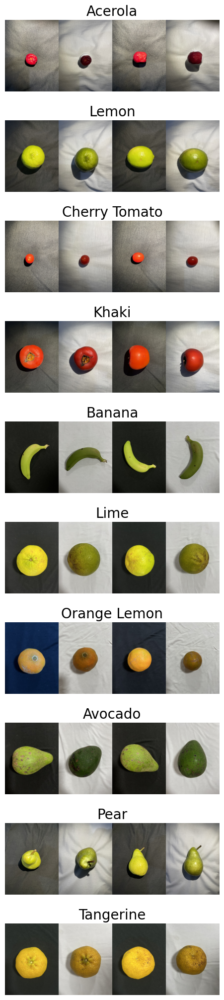

In [5]:
from utils.show_images import plot_class_montages
caminho_base_frutas = 'fruits_classes'
lista_de_classes = [
    'acerola', 'lemon', 'cherry_tomato', 'khaki', 'banana',
    'lime', 'orange_lemon', 'avocado', 'pear', 'tangerine'
]
plot_class_montages(base_path=caminho_base_frutas, class_names=lista_de_classes)

<h2>2. <i>Data annotation</i></h2>
<ul>
    <li>Utilizando a ferramenta CVAT, foi feito o <i>bounding box</i> em todas as imagens originais</li>
</ul>

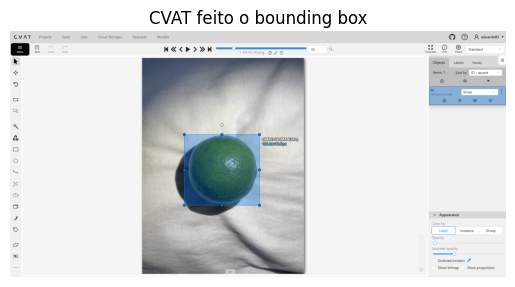

In [6]:
base_dir = os.getcwd()
img_path = os.path.join(base_dir, 'docs', 'limao_bounding_box.png')
img = ski.io.imread(img_path)

#img = ski.data.cat()
pl.imshow(img)
pl.title("CVAT feito o bounding box")
pl.axis('off')
pl.show()

<h2>3. <i>Data augmentation</i></h2>
<ul>
    <li>Dividimos essa etapa em duas partes</li>
    <ol>
        <li> Fizemos o pre-processing das imagens, corrigindo seu background;</li>
        <li> Fizemos o data-augmented para aumentar o dataset em 3x.</li>
    </ol>
</ul>

In [7]:
from utils import augmented_dataset as ad
dataset_dir = './fruits_classes'
dataset_augmented_dir = './augmented_dataset'
augmentations = {
    'log': ad.aplicar_log,
    'exp': ad.aplicar_exponencial,
    'average': ad.aplicar_filtro_media
}
ad.process_and_augment_dataset(
    source_dir=dataset_dir,
    output_dir=dataset_augmented_dir,
    class_map=fruits_dict,
    augmentations=augmentations
)

Iniciando o processo de aumento de dados...
Diretório de saída: 'C:\Users\Eduardo\Desktop\Estudos\Trabalho PDI\augmented_dataset'

Processando classe: 'acerola'...
  Encontradas 20 imagens.

Processando classe: 'lemon'...
  Encontradas 20 imagens.

Processando classe: 'cherry_tomato'...
  Encontradas 20 imagens.

Processando classe: 'khaki'...
  Encontradas 20 imagens.

Processando classe: 'banana'...
  Encontradas 20 imagens.

Processando classe: 'lime'...
  Encontradas 20 imagens.

Processando classe: 'orange_lemon'...
  Encontradas 20 imagens.

Processando classe: 'avocado'...
  Encontradas 20 imagens.

Processando classe: 'tangerine'...
  Encontradas 20 imagens.

Processando classe: 'pear'...
  Encontradas 20 imagens.

--- Processo de aumento de dados concluído! ---



Gerando montagens para 10 classes de './augmented_dataset'...


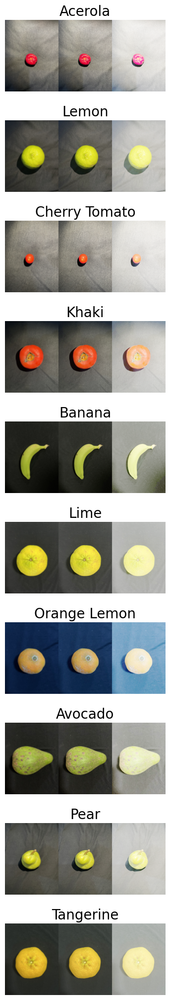

In [8]:
plot_class_montages(base_path=dataset_augmented_dir, class_names=lista_de_classes, images_per_class=3, grid_shape=(1,3))

<h2>4. <i>Data normalization</i></h2>
<ul>
    <li>
    A <i>Data normalization</i> envolve a equalização de histogramas para melhorar a qualidade da imagem. O processo visa ajustar o contraste e o brilho das imagens para maior consistência e clareza.</li>
    <li>Passos:</li>
    <ol>
        <li>Equalização do histograma: ajuste o histograma da imagem para melhorar o contraste e distribuir os valores de pixels de maneira mais uniforme.</li>
        <li>Analisando os resultados: avalie os resultados da equalização do histograma para garantir que os ajustes atendam às melhorias de qualidade desejadas e aprimorem a imagem de forma eficaz.</li>
    </ol>
</ul>

In [14]:
from utils import data_normalization as dn

In [27]:
img_data = dn.load_image_data(dataset_dir)

Carregando imagens de 'C:\Users\Eduardo\Desktop\Estudos\Trabalho PDI\fruits_classes'...
Dados carregados para 10 classes.



--- 1. Protótipos Médios por Classe ---


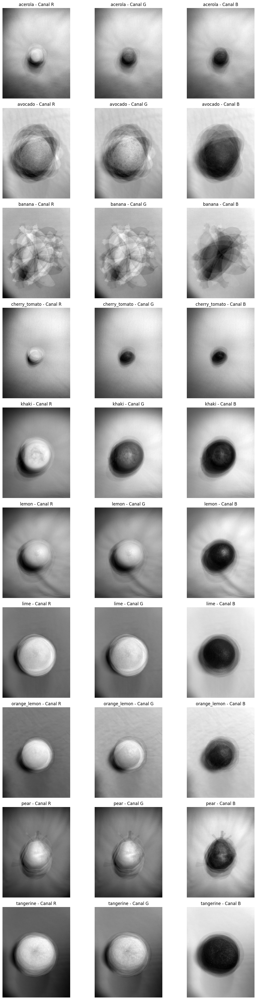

In [18]:
# Célula 3: Calcular e Plotar Protótipos Médios
print("\n--- 1. Protótipos Médios por Classe ---")
mean_prototypes = dn.calculate_mean_prototypes(img_data)
dn.plot_mean_prototypes(mean_prototypes)


--- 2. Histogramas Médios por Classe ---


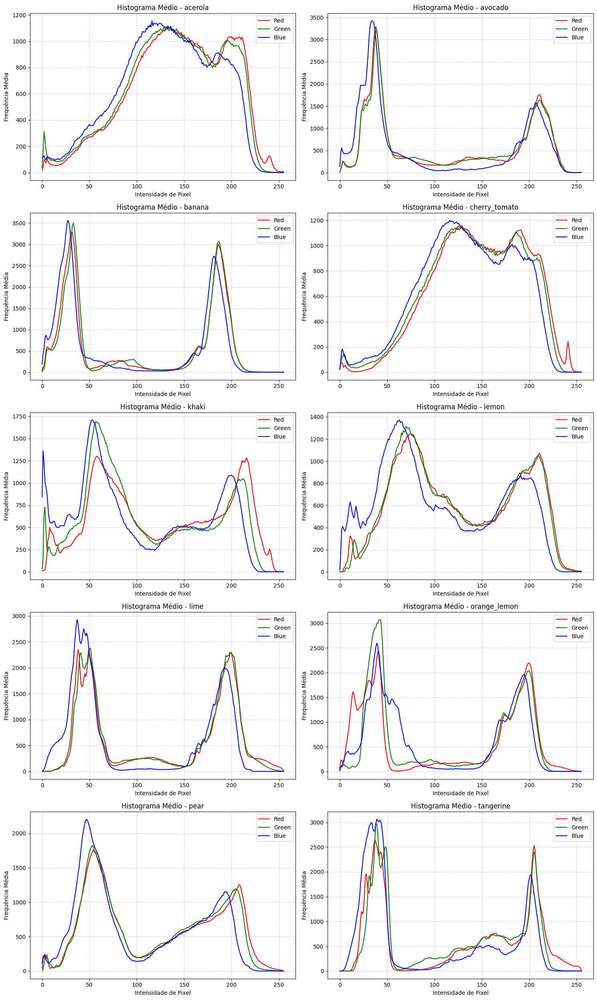

In [19]:
# Célula 4: Calcular e Plotar Histogramas Médios
print("\n--- 2. Histogramas Médios por Classe ---")
mean_histograms = dn.calculate_mean_histograms(img_data)
dn.plot_mean_histograms(mean_histograms)

In [22]:
# Célula 5: Calcular e Exibir a Variância dos Histogramas
print("\n--- 3. Variância do Histograma Médio Normalizado ---")
# Pega a forma de uma imagem qualquer para o cálculo do número de pixels
# É importante garantir que todas as imagens tenham o mesmo tamanho
sample_class = next(iter(img_data))
sample_image_shape = img_data[sample_class][0].shape

hist_variance = dn.calculate_histogram_variance(mean_histograms, sample_image_shape)

# Imprime os resultados da variância de forma organizada
for classe, variancias in hist_variance.items():
    print(f"\nClasse: {classe}")
    for canal, var in variancias.items():
        print(f"  - Variância do Canal {canal}: {var:.10f}")


--- 3. Variância do Histograma Médio Normalizado ---

Classe: acerola
  - Variância do Canal R: 0.0000068806
  - Variância do Canal G: 0.0000068593
  - Variância do Canal B: 0.0000069348

Classe: avocado
  - Variância do Canal R: 0.0000199471
  - Variância do Canal G: 0.0000176016
  - Variância do Canal B: 0.0000253109

Classe: banana
  - Variância do Canal R: 0.0000324949
  - Variância do Canal G: 0.0000339756
  - Variância do Canal B: 0.0000347215

Classe: cherry_tomato
  - Variância do Canal R: 0.0000081246
  - Variância do Canal G: 0.0000079377
  - Variância do Canal B: 0.0000079696

Classe: khaki
  - Variância do Canal R: 0.0000048386
  - Variância do Canal G: 0.0000074016
  - Variância do Canal B: 0.0000070925

Classe: lemon
  - Variância do Canal R: 0.0000052837
  - Variância do Canal G: 0.0000058112
  - Variância do Canal B: 0.0000054565

Classe: lime
  - Variância do Canal R: 0.0000206145
  - Variância do Canal G: 0.0000220118
  - Variância do Canal B: 0.0000278065

Classe: o

In [23]:
# Célula 6: Normalizar o Dataset por Equalização e Plotar Comparação
print("\n--- 4. Dataset Normalizado por Equalização de Histograma ---")
normalized_data = dn.equalize_histogram_dataset(img_data)


--- 4. Dataset Normalizado por Equalização de Histograma ---


Mostrando comparação de uma imagem por classe (Original vs. Equalizada):


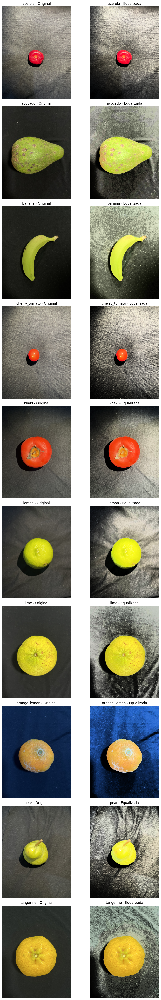

In [24]:
print("Mostrando comparação de uma imagem por classe (Original vs. Equalizada):")
dn.plot_equalization_comparison(img_data, normalized_data)

<h2>5. Segmentação do objeto de interesse</h2>
<ul>
    <li>Para realizar essa tarefa, utilizamos o CVAT que tem um funcao nativa para fazer o groud truth</li>
    <li>Depois disso pegamos as figuras e colocamos num algoritmo para ficar somente com valores binarios, branco ou preto.</li>
</ul>

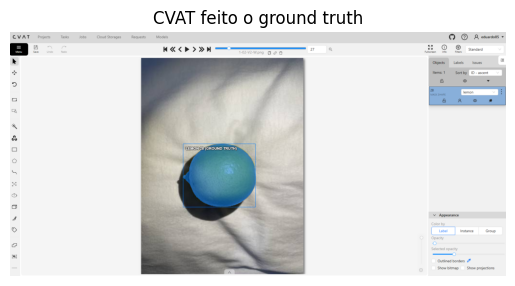

In [9]:
base_dir = os.getcwd()
img_path = os.path.join(base_dir, 'docs', 'limao_ground_truth.png')
img = ski.io.imread(img_path)

#img = ski.data.cat()
pl.imshow(img)
pl.title("CVAT feito o ground truth")
pl.axis('off')
pl.show()

<li>Depois desssa parte foi feito um algoritmo para colocar todas as fotos em binario.</li>
<li>Caso tenha curisiodade, o algoritmo esta no diretorio: "./docs/fotos_em_binario.py"</li>


Gerando montagens para 10 classes de './ground_truth'...


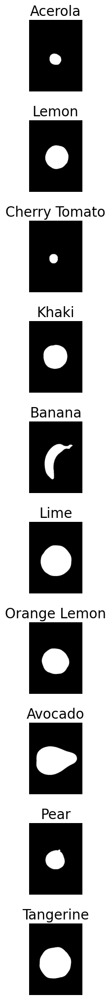

In [11]:
plot_class_montages(base_path="./ground_truth", class_names=lista_de_classes, images_per_class=1, grid_shape=(1,1))

<h2>6. Classificação</h2>
<ul>
    <li>Primeiro, passamos todos os nomes de classes, arquivo, coordenadas e bounding box para um dataframe;</li>
    <li>Consultamos esse dataframe, imagem por imagem, fizemos um crop na area do bounding box;</li>
    <li>Criamos uma area de 64 x 64, fizemos um resize na area do bounding box, de forma que nao fique distorcido.</li>
    <li>Pegamos a imagem, e passamos ela em dois algortimos extratores de features, .</li>
</ul>

Para ver melhor o classificador, acessar `1. data_frames_vector.ipynb` e `2. cassificator.ipynb`.